In [1]:
import random
import os
import numpy as np
import math
import json
import torch
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.models import vgg19
from PIL import Image
from torchvision.utils import save_image, make_grid
import argparse
import itertools
import sys
import cv2
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

In [2]:
from PIL import Image
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Update your paths
IMG_TRAIN_PATH = '../input/sr-3000/SR-3000/HR-1250/train'
IMG_TEST_PATH = '../input/sr-3000/SR-3000/HR-1250/test'
IMG_VALID_PATH = '../input/sr-3000/SR-3000/HR-1250/val'

# Ensure directories exist
os.makedirs("images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

# Define Options class
class Options:
    epoch = 0 
    n_epochs = 60
    dataset_name = "sr-sat-img" 
    batch_size = 32
    lr = 0.0002 
    b1 = 0.5 
    b2 = 0.999 
    decay_epoch = 100 
    n_cpu = 8 
    hr_height = 256 
    hr_width = 256 
    channels = 3 
    sample_interval = 500 
    checkpoint_interval = 10

opt = Options()

# Normalization parameters for pre-trained PyTorch models
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

class ImageDataset(Dataset):
    def __init__(self, filename_list, hr_shape):
        hr_height, hr_width = hr_shape
        self.lr_transform = transforms.Compose([
            transforms.Resize((hr_height // 4, hr_height // 4), Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])
        self.hr_transform = transforms.Compose([
            transforms.Resize((hr_height, hr_width), Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])
        self.files = filename_list

    def __getitem__(self, index):
        img = Image.open(self.files[index % len(self.files)])
        if img.mode != 'RGB':
            img = img.convert('RGB')
        img_lr = self.lr_transform(img)
        img_hr = self.hr_transform(img)
        return {"lr": img_lr, "hr": img_hr}

    def __len__(self):
        return len(self.files)

hr_shape = (opt.hr_height, opt.hr_width)

# Create datasets
train_filenames = [os.path.join(IMG_TRAIN_PATH, filename) for filename in os.listdir(IMG_TRAIN_PATH)]
test_filenames = [os.path.join(IMG_TEST_PATH, filename) for filename in os.listdir(IMG_TEST_PATH)]
valid_filenames = [os.path.join(IMG_VALID_PATH, filename) for filename in os.listdir(IMG_VALID_PATH)]

train_dataset = ImageDataset(train_filenames, hr_shape=hr_shape)
test_dataset = ImageDataset(test_filenames, hr_shape=hr_shape)
valid_dataset = ImageDataset(valid_filenames, hr_shape=hr_shape)

# Create data loaders
train_loader = DataLoader(train_dataset,
                          batch_size=opt.batch_size,
                          shuffle=True,
                          num_workers=opt.n_cpu)

test_loader = DataLoader(test_dataset,
                         batch_size=opt.batch_size,
                         shuffle=False,
                         num_workers=opt.n_cpu)

valid_loader = DataLoader(valid_dataset,
                          batch_size=opt.batch_size,
                          shuffle=False,
                          num_workers=opt.n_cpu)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


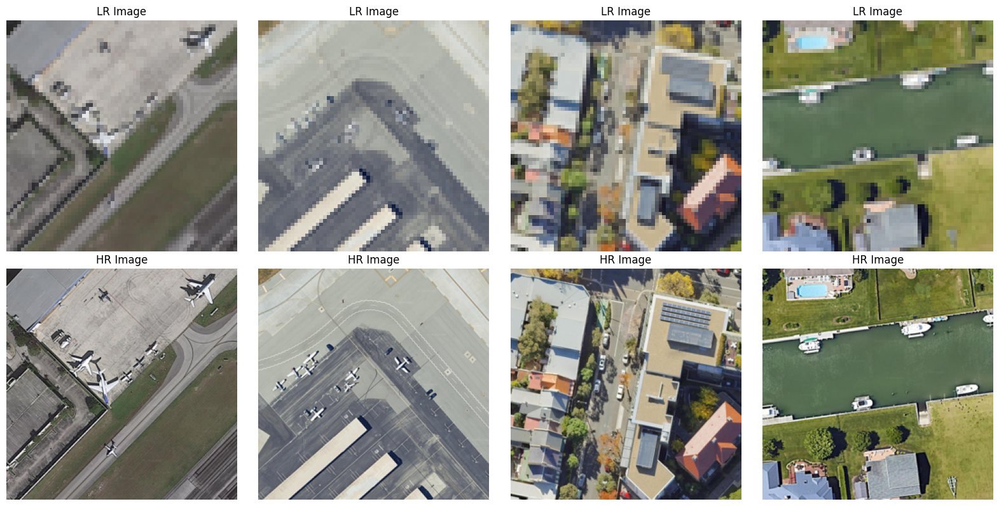

In [3]:
import matplotlib.pyplot as plt

# Define a function to unnormalize the image
def unnormalize(image, mean, std):
    """
    Unnormalize a tensor image with mean and standard deviation.
    """
    for t, m, s in zip(image, mean, std):
        t.mul_(s).add_(m)
    return image

# Get a batch of LR and HR images
for batch in train_loader:
    lr_images, hr_images = batch["lr"], batch["hr"]
    break  # break to just get one batch

# Plot LR and HR images
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))

for i in range(4):
    lr_image = unnormalize(lr_images[i].cpu(), mean, std).permute(1, 2, 0)
    hr_image = unnormalize(hr_images[i].cpu(), mean, std).permute(1, 2, 0)

    axes[0, i].imshow(lr_image)
    axes[0, i].set_title('LR Image')
    axes[0, i].axis('off')

    axes[1, i].imshow(hr_image)
    axes[1, i].set_title('HR Image')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [4]:
# Size of LR images
print("LR image size:", (opt.channels, opt.hr_height // 4, opt.hr_width // 4))

# Size of HR images
print("HR image size:", (opt.channels, opt.hr_height, opt.hr_width))

# Size of generated images
# Assuming the generator outputs images of the same size as HR images
print("Generated image size:", (opt.channels, opt.hr_height, opt.hr_width))

LR image size: (3, 64, 64)
HR image size: (3, 256, 256)
Generated image size: (3, 256, 256)


In [5]:
#feature extractor
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        vgg19_model = vgg19(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(vgg19_model.features.children())[:18])
    
    def forward(self, img):
        return self.feature_extractor(img)

#Residual block
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
            nn.PReLU(),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
        )

    def forward(self, x):
        return x + self.conv_block(x)

#Generator
class GeneratorResNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_residual_blocks=16):
        super(GeneratorResNet, self).__init__()

        # First layer
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels, 64, kernel_size=9, stride=1, padding=4), nn.PReLU())

        # Residual blocks
        res_blocks = []
        for _ in range(n_residual_blocks):
            res_blocks.append(ResidualBlock(64))
        self.res_blocks = nn.Sequential(*res_blocks)

        # Second conv layer post residual blocks
        self.conv2 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64, 0.8))

        # Upsampling layers
        upsampling = []
        for out_features in range(2):
            upsampling += [
                # nn.Upsample(scale_factor=2),
                nn.Conv2d(64, 256, 3, 1, 1),
                nn.BatchNorm2d(256),
                nn.PixelShuffle(upscale_factor=2),
                nn.PReLU(),
            ]
        self.upsampling = nn.Sequential(*upsampling)

        # Final output layer
        self.conv3 = nn.Sequential(nn.Conv2d(64, out_channels, kernel_size=9, stride=1, padding=4), nn.Tanh())

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = torch.add(out1, out2)
        out = self.upsampling(out)
        out = self.conv3(out)
        return out

#Discriminator
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2 ** 4), int(in_width / 2 ** 4)
        self.output_shape = (1, patch_h, patch_w)

        def discriminator_block(in_filters, out_filters, first_block=False):
            layers = []
            layers.append(nn.Conv2d(in_filters, out_filters, kernel_size=3, stride=1, padding=1))
            if not first_block:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            layers.append(nn.Conv2d(out_filters, out_filters, kernel_size=3, stride=2, padding=1))
            layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        layers = []
        in_filters = in_channels
        for i, out_filters in enumerate([64, 128, 256, 512]):
            layers.extend(discriminator_block(in_filters, out_filters, first_block=(i == 0)))
            in_filters = out_filters

        layers.append(nn.Conv2d(out_filters, 1, kernel_size=3, stride=1, padding=1))

        self.model = nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

In [6]:
cuda = torch.cuda.is_available()

# Initialize generator and discriminator
generator = GeneratorResNet()
discriminator = Discriminator(input_shape=(opt.channels, *hr_shape))
feature_extractor = FeatureExtractor()

# Set feature extractor to inference mode
feature_extractor.eval()

# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_content = torch.nn.L1Loss()

# Move models and data to GPU if available
if cuda:
    generator = generator.cuda()
    discriminator = discriminator.cuda()
    feature_extractor = feature_extractor.cuda()
    criterion_GAN = criterion_GAN.cuda()
    criterion_content = criterion_content.cuda()
    generator = torch.nn.DataParallel(generator)
    discriminator = torch.nn.DataParallel(discriminator)
    feature_extractor = torch.nn.DataParallel(feature_extractor)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

# Define Tensor type based on GPU availability
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 160MB/s]


In [7]:
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# #for using 1GPU 
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

stat_train = {'D_loss':[], 'G_loss':[], 'val_D_loss':[], 'val_G_loss':[], 'train_psnr':[], 'train_ssim':[], 'val_psnr':[], 'val_ssim':[]}

# Define the training loop
for epoch in range(opt.epoch, opt.n_epochs):
    print('-------------------------------------------------')
    #print(f"Epoch {epoch}/{opt.n_epochs}")
    D_loss_epoch = 0
    G_loss_epoch = 0
    val_D_loss_epoch = 0
    val_G_loss_epoch = 0
    train_psnr = 0
    train_ssim = 0
    val_psnr = 0
    val_ssim = 0

    # Training loop with tqdm
    for i, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch}/{opt.n_epochs}")):
        num_batches = len(train_loader)
        # Transfer batch to GPU if available
        imgs_lr = batch["lr"].to(device)
        imgs_hr = batch["hr"].to(device)

        # Adversarial ground truths
        
        #for using 1 GPU only
        #valid = torch.ones((imgs_lr.size(0), *discriminator.output_shape)).to(device)
        #fake = torch.zeros((imgs_lr.size(0), *discriminator.output_shape)).to(device) 
        
        #for using 2 GPU
        output_shape = discriminator(imgs_hr).shape[2:]
        valid = torch.ones((imgs_lr.size(0), *output_shape)).to(device)
        fake = torch.zeros((imgs_lr.size(0), *output_shape)).to(device)


        # Train Generators
        optimizer_G.zero_grad()

        # Generate a high resolution image from low resolution input
        gen_hr = generator(imgs_lr)

        # Adversarial loss
        loss_GAN = criterion_GAN(discriminator(gen_hr), valid)

        # Content loss
        gen_features = feature_extractor(gen_hr)
        real_features = feature_extractor(imgs_hr)
        loss_content = criterion_content(gen_features, real_features.detach())

        # Total loss
        loss_G = loss_content + 1e-3 * loss_GAN

        loss_G.backward()
        optimizer_G.step()

        # Train Discriminator
        optimizer_D.zero_grad()

        # Loss of real and fake images
        loss_real = criterion_GAN(discriminator(imgs_hr), valid)
        loss_fake = criterion_GAN(discriminator(gen_hr.detach()), fake)

        # Total loss
        loss_D = (loss_real + loss_fake) / 2

        loss_D.backward()
        optimizer_D.step()

        D_loss_epoch += loss_D.item()
        G_loss_epoch += loss_G.item()

        # Calculate PSNR and SSIM
        gen_hr = gen_hr.cpu().detach().numpy()
        imgs_hr = imgs_hr.cpu().detach().numpy()
        train_psnr += peak_signal_noise_ratio(imgs_hr, gen_hr, data_range=1.0)
        train_ssim += structural_similarity(imgs_hr, gen_hr, win_size=min(imgs_hr.shape[1], imgs_hr.shape[2], 11), data_range=1.0, multichannel=True)

    train_psnr /= num_batches
    train_ssim /= num_batches

    # Validation loop
    with torch.no_grad():
        for j, valid_batch in enumerate(valid_loader):
            # Transfer batch to GPU if available
            imgs_lr_val = valid_batch["lr"].to(device)
            imgs_hr_val = valid_batch["hr"].to(device)

            # Validation loss calculation for Discriminator
            val_loss_real = criterion_GAN(discriminator(imgs_hr_val), valid)
            val_loss_fake = criterion_GAN(discriminator(generator(imgs_lr_val).detach()), fake)
            val_loss_D = (val_loss_real + val_loss_fake) / 2
            val_D_loss_epoch += val_loss_D.item()

            # Validation loss calculation for Generator
            val_gen_hr = generator(imgs_lr_val)
            val_loss_GAN = criterion_GAN(discriminator(val_gen_hr), valid)
            val_gen_features = feature_extractor(val_gen_hr)
            val_real_features = feature_extractor(imgs_hr_val)
            val_loss_content = criterion_content(val_gen_features, val_real_features.detach())
            val_loss_G = val_loss_content + 1e-3 * val_loss_GAN
            val_G_loss_epoch += val_loss_G.item()

            # Calculate PSNR and SSIM
            val_gen_hr = val_gen_hr.cpu().detach().numpy()
            imgs_hr_val = imgs_hr_val.cpu().detach().numpy()
            val_psnr += peak_signal_noise_ratio(imgs_hr_val, val_gen_hr, data_range=1.0)
            val_ssim += structural_similarity(imgs_hr_val, val_gen_hr, win_size=min(imgs_hr_val.shape[1], imgs_hr_val.shape[2], 11), data_range=1.0, multichannel=True)
            
    val_psnr /= len(valid_loader)
    val_ssim /= len(valid_loader)

    # Log Progress and Save Models
    stat_train['D_loss'].append(D_loss_epoch / num_batches)
    stat_train['G_loss'].append(G_loss_epoch / num_batches)
    stat_train['val_D_loss'].append(val_D_loss_epoch / len(valid_loader))
    stat_train['val_G_loss'].append(val_G_loss_epoch / len(valid_loader))
    stat_train['train_psnr'].append(train_psnr)
    stat_train['train_ssim'].append(train_ssim)
    stat_train['val_psnr'].append(val_psnr)
    stat_train['val_ssim'].append(val_ssim)

    print(f"Train D_loss: {stat_train['D_loss'][-1]} || Train G_loss: {stat_train['G_loss'][-1]} || Val D_loss: {stat_train['val_D_loss'][-1]} || Val G_loss: {stat_train['val_G_loss'][-1]}")
    print(f"Train PSNR: {train_psnr} || Train SSIM: {train_ssim} || Val PSNR: {val_psnr} || Val SSIM: {val_ssim}")

    if opt.checkpoint_interval != -1 and epoch % opt.checkpoint_interval == 0:
        # Save model checkpoints
        torch.save(generator.state_dict(), f"saved_models/generator_epoch_{epoch}.pth")
        torch.save(discriminator.state_dict(), f"saved_models/discriminator_epoch_{epoch}.pth")

# Save final models
torch.save(generator.state_dict(), "saved_models/generator_final.pth")
torch.save(discriminator.state_dict(), "saved_models/discriminator_final.pth")


-------------------------------------------------


Epoch 0/60:   0%|          | 0/66 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/opt/conda/lib/python3.10/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 16, 16])) that is different to the input size (torch.Size([32, 1, 16, 16])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
Epoch 0/60:  98%|█████████▊| 65/66 [02:55<00:02,  2.51s/it]/opt/conda/lib/python3.10/site-packages/torch/nn/module

Train D_loss: 0.2142441560598937 || Train G_loss: 1.2609240087595852 || Val D_loss: 0.021851404619060065 || Val G_loss: 1.1994250448126542
Train PSNR: -0.5206184669907018 || Train SSIM: 0.004530393650215969 || Val PSNR: -0.7065509312135778 || Val SSIM: -0.002713456050207082
-------------------------------------------------


Epoch 1/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.017650233172444685 || Train G_loss: 1.1930028236273564 || Val D_loss: 0.0068432453431581195 || Val G_loss: 1.1661340374695628
Train PSNR: -0.6850308361568387 || Train SSIM: -0.003808293379258041 || Val PSNR: -0.8541858874274356 || Val SSIM: -0.0030329058062900406
-------------------------------------------------


Epoch 2/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.008697027608639362 || Train G_loss: 1.1847224361968762 || Val D_loss: 0.0051971407558180785 || Val G_loss: 1.2224253917995251
Train PSNR: -0.7880318460794595 || Train SSIM: -0.002718536597589697 || Val PSNR: -0.9690904772734751 || Val SSIM: -0.0031855557860875614
-------------------------------------------------


Epoch 3/60: 100%|██████████| 66/66 [02:54<00:00,  2.64s/it]


Train D_loss: 0.00851639125242152 || Train G_loss: 1.1968740080342148 || Val D_loss: 0.007097410013605105 || Val G_loss: 1.1647499987953587
Train PSNR: -1.2320501181144823 || Train SSIM: -0.0008109015669798023 || Val PSNR: -1.2845583088220396 || Val SSIM: -0.0006696444378399306
-------------------------------------------------


Epoch 4/60: 100%|██████████| 66/66 [02:50<00:00,  2.59s/it]


Train D_loss: 0.00578490831663437 || Train G_loss: 1.1836936708652612 || Val D_loss: 0.0063271232341465195 || Val G_loss: 1.1625262185146934
Train PSNR: -1.218481620952161 || Train SSIM: -0.0003519215616479521 || Val PSNR: -1.3075696522878528 || Val SSIM: -0.00038114516198447287
-------------------------------------------------


Epoch 5/60: 100%|██████████| 66/66 [02:51<00:00,  2.60s/it]


Train D_loss: 0.0040075284989804704 || Train G_loss: 1.1817478808489712 || Val D_loss: 0.0018536043721006105 || Val G_loss: 1.1614187265697278
Train PSNR: -1.2306731687046888 || Train SSIM: -0.0002982622290273264 || Val PSNR: -1.329982804014714 || Val SSIM: -0.0002487404628259945
-------------------------------------------------


Epoch 6/60: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.004316534991658321 || Train G_loss: 1.1888029783061056 || Val D_loss: 0.0019847376848031815 || Val G_loss: 1.1651516023435091
Train PSNR: -1.4580706970023625 || Train SSIM: 0.0002740812424550565 || Val PSNR: -1.6842114279618365 || Val SSIM: 0.0008517838380056853
-------------------------------------------------


Epoch 7/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0034962195151654833 || Train G_loss: 1.1825072982094504 || Val D_loss: 0.0027892487246151034 || Val G_loss: 1.1613797765029104
Train PSNR: -1.5827768571817884 || Train SSIM: 0.0013366589506644845 || Val PSNR: -1.667505822485498 || Val SSIM: 0.0011447308660676014
-------------------------------------------------


Epoch 8/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0036899702690513523 || Train G_loss: 1.1801807555285366 || Val D_loss: 0.005631367602434598 || Val G_loss: 1.1601803741957013
Train PSNR: -1.5843876291840466 || Train SSIM: 0.0018022983745194891 || Val PSNR: -1.6646306836244666 || Val SSIM: 0.0016898393757035133
-------------------------------------------------


Epoch 9/60: 100%|██████████| 66/66 [02:52<00:00,  2.62s/it]


Train D_loss: 0.002731522729542727 || Train G_loss: 1.1798416610920068 || Val D_loss: 0.0036789199312854755 || Val G_loss: 1.159602020916186
Train PSNR: -1.5689446947820531 || Train SSIM: 0.002013896759634055 || Val PSNR: -1.6442119623596916 || Val SSIM: 0.0018560899014789095
-------------------------------------------------


Epoch 10/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.004304430615086334 || Train G_loss: 1.1787429397756404 || Val D_loss: 0.00217862753810263 || Val G_loss: 1.158936343694988
Train PSNR: -1.5329328275971206 || Train SSIM: 0.0017694123531772376 || Val PSNR: -1.60115157130091 || Val SSIM: 0.0018080840614755477
-------------------------------------------------


Epoch 11/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.002994627954621771 || Train G_loss: 1.178467681010564 || Val D_loss: 0.006971929786040595 || Val G_loss: 1.1586972663277073
Train PSNR: -1.4934235017447484 || Train SSIM: 0.0019187659851212244 || Val PSNR: -1.5545289221029104 || Val SSIM: 0.0018208595683269705
-------------------------------------------------


Epoch 12/60: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.0029993438237755927 || Train G_loss: 1.1787305691025474 || Val D_loss: 0.0011540706342968502 || Val G_loss: 1.158311636824357
Train PSNR: -1.4410029827191972 || Train SSIM: 0.0023881729327036943 || Val PSNR: -1.4980693741350877 || Val SSIM: 0.0021145640156423817
-------------------------------------------------


Epoch 13/60: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.004410918390159636 || Train G_loss: 1.1885815876902956 || Val D_loss: 0.0013151582832889336 || Val G_loss: 1.1653959186453569
Train PSNR: -1.4963154476359328 || Train SSIM: 0.001789704378374547 || Val PSNR: -1.8192498558906054 || Val SSIM: -2.19838560051461e-05
-------------------------------------------------


Epoch 14/60: 100%|██████████| 66/66 [02:53<00:00,  2.63s/it]


Train D_loss: 0.0014455031910487874 || Train G_loss: 1.181493509899486 || Val D_loss: 0.002974184622105799 || Val G_loss: 1.1603252009341591
Train PSNR: -1.7499737797059103 || Train SSIM: 9.023605964512321e-05 || Val PSNR: -1.8201003715280355 || Val SSIM: 0.0004078018146320034
-------------------------------------------------


Epoch 15/60: 100%|██████████| 66/66 [02:52<00:00,  2.62s/it]


Train D_loss: 0.0017629289244668503 || Train G_loss: 1.1782289996291653 || Val D_loss: 0.0019493245237850044 || Val G_loss: 1.1590610177893388
Train PSNR: -1.7221463050841135 || Train SSIM: 0.00044841190047029155 || Val PSNR: -1.772762044277527 || Val SSIM: 0.0008089822197668567
-------------------------------------------------


Epoch 16/60: 100%|██████████| 66/66 [02:52<00:00,  2.61s/it]


Train D_loss: 0.001581326539797539 || Train G_loss: 1.17878448601925 || Val D_loss: 0.0013131047782831285 || Val G_loss: 1.158392818350541
Train PSNR: -1.6643541143125742 || Train SSIM: 0.0009006674620431059 || Val PSNR: -1.715850008318854 || Val SSIM: 0.0013199107369067215
-------------------------------------------------


Epoch 17/60: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.00299860976431801 || Train G_loss: 1.178088735450398 || Val D_loss: 0.0006731436802319399 || Val G_loss: 1.1578502027611983
Train PSNR: -1.593613559728004 || Train SSIM: 0.0014901241211976884 || Val PSNR: -1.6508317604246854 || Val SSIM: 0.0019736392071355415
-------------------------------------------------


Epoch 18/60: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.0019293719687442663 || Train G_loss: 1.176811237226833 || Val D_loss: 0.0006796437848702466 || Val G_loss: 1.1574529283925106
Train PSNR: -1.5171050613679913 || Train SSIM: 0.0024109033449031384 || Val PSNR: -1.582196821671901 || Val SSIM: 0.0028663509196914638
-------------------------------------------------


Epoch 19/60: 100%|██████████| 66/66 [02:53<00:00,  2.62s/it]


Train D_loss: 0.0030969380203521614 || Train G_loss: 1.1769569606492014 || Val D_loss: 0.0016496464070913039 || Val G_loss: 1.1575805701707538
Train PSNR: -1.4559891643148977 || Train SSIM: 0.0030616654593942703 || Val PSNR: -1.6234814937223085 || Val SSIM: 0.0018239464609316853
-------------------------------------------------


Epoch 20/60: 100%|██████████| 66/66 [02:52<00:00,  2.61s/it]


Train D_loss: 0.006150972311540197 || Train G_loss: 1.193227692083879 || Val D_loss: 0.0011631470528970424 || Val G_loss: 1.1619847699215538
Train PSNR: -1.6756485390819744 || Train SSIM: -7.974159539205293e-05 || Val PSNR: -1.8232580700493475 || Val SSIM: -0.0004338206794530417
-------------------------------------------------


Epoch 21/60: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.0008635394496553945 || Train G_loss: 1.1806833328622761 || Val D_loss: 0.0011461900400095864 || Val G_loss: 1.1594288098184686
Train PSNR: -1.7196373501698607 || Train SSIM: 0.00013269336060744316 || Val PSNR: -1.7765271785124483 || Val SSIM: 0.0005991879615493305
-------------------------------------------------


Epoch 22/60: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.00104323898046983 || Train G_loss: 1.1786033619533887 || Val D_loss: 0.002002794362947737 || Val G_loss: 1.1582139542228298
Train PSNR: -1.6653106477431374 || Train SSIM: 0.000992503992380138 || Val PSNR: -1.7217320143067492 || Val SSIM: 0.0015832458116703657
-------------------------------------------------


Epoch 23/60: 100%|██████████| 66/66 [02:51<00:00,  2.59s/it]


Train D_loss: 0.0013125279197772738 || Train G_loss: 1.1780341809446162 || Val D_loss: 0.0011055373531570168 || Val G_loss: 1.1574863634611432
Train PSNR: -1.6182908353401593 || Train SSIM: 0.00188576084544024 || Val PSNR: -1.7017662642738605 || Val SSIM: 0.0019689161931967965
-------------------------------------------------


Epoch 24/60: 100%|██████████| 66/66 [02:49<00:00,  2.58s/it]


Train D_loss: 0.0018360378682810926 || Train G_loss: 1.1766882791663662 || Val D_loss: 0.0007164744494825994 || Val G_loss: 1.1568153406444348
Train PSNR: -1.5732862306377524 || Train SSIM: 0.0026831014960674677 || Val PSNR: -1.6180829603089744 || Val SSIM: 0.0030469444806153277
-------------------------------------------------


Epoch 25/60: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.0014741373976876 || Train G_loss: 1.1803370714187622 || Val D_loss: 0.0019682104037584444 || Val G_loss: 1.1580454801258289
Train PSNR: -1.7836918504650807 || Train SSIM: 0.0009305850839297595 || Val PSNR: -1.8423415299808952 || Val SSIM: 0.0020542202504854425
-------------------------------------------------


Epoch 26/60: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.0022127372009863116 || Train G_loss: 1.1778856335264263 || Val D_loss: 0.00046090778625129084 || Val G_loss: 1.1574031491028636
Train PSNR: -1.7531395517502617 || Train SSIM: 0.0021321693508206505 || Val PSNR: -1.8221716552319664 || Val SSIM: 0.0026622702977984205
-------------------------------------------------


Epoch 27/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0007693525902030876 || Train G_loss: 1.1769089617512443 || Val D_loss: 0.003707412385234707 || Val G_loss: 1.1568266843494617
Train PSNR: -1.7101663603541724 || Train SSIM: 0.0027337143592758395 || Val PSNR: -1.7907582049443533 || Val SSIM: 0.0027269441670285176
-------------------------------------------------


Epoch 28/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0019713232009742183 || Train G_loss: 1.1763954415465847 || Val D_loss: 0.0017052248218341877 || Val G_loss: 1.156399262578864
Train PSNR: -1.6557963340214843 || Train SSIM: 0.0030286432888243886 || Val PSNR: -1.7219724871093574 || Val SSIM: 0.003452382221889188
-------------------------------------------------


Epoch 29/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.001940616562602703 || Train G_loss: 1.175780177116394 || Val D_loss: 0.0012638275879190157 || Val G_loss: 1.1562557722392834
Train PSNR: -1.585020210880666 || Train SSIM: 0.003972241733831506 || Val PSNR: -1.6861116462720525 || Val SSIM: 0.0033577366803369288
-------------------------------------------------


Epoch 30/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.3135416694655732 || Train G_loss: 1.1894752292922048 || Val D_loss: 0.018283434996479435 || Val G_loss: 1.160460547397011
Train PSNR: -1.6924947852086423 || Train SSIM: -0.0036645787991589447 || Val PSNR: -1.7581930662115168 || Val SSIM: -0.004952017858983491
-------------------------------------------------


Epoch 31/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.011354369471188296 || Train G_loss: 1.1788377978584983 || Val D_loss: 0.0028538659067922517 || Val G_loss: 1.1580906165273566
Train PSNR: -1.5712737637591565 || Train SSIM: -0.005464003205787063 || Val PSNR: -1.5534895861424634 || Val SSIM: -0.00468628754942136
-------------------------------------------------


Epoch 32/60: 100%|██████████| 66/66 [02:52<00:00,  2.61s/it]


Train D_loss: 0.004735726526246943 || Train G_loss: 1.1784072301604531 || Val D_loss: 0.003843104160439811 || Val G_loss: 1.1569379379874782
Train PSNR: -1.4028341116844547 || Train SSIM: -0.0032875664505360403 || Val PSNR: -1.3844580599498695 || Val SSIM: -0.003807784918074435
-------------------------------------------------


Epoch 33/60: 100%|██████████| 66/66 [02:53<00:00,  2.63s/it]


Train D_loss: 0.005974246079638375 || Train G_loss: 1.1841081127975925 || Val D_loss: 0.0022427138112681476 || Val G_loss: 1.1640270571959646
Train PSNR: -1.4475815899189464 || Train SSIM: -0.0021192023945511506 || Val PSNR: -1.8742364589190201 || Val SSIM: -0.0005032738704483765
-------------------------------------------------


Epoch 34/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0026913105111540945 || Train G_loss: 1.1803945628079502 || Val D_loss: 0.0013500807966154657 || Val G_loss: 1.1579937495683368
Train PSNR: -1.7655224967262422 || Train SSIM: -0.0007995921671900345 || Val PSNR: -1.8320190083136147 || Val SSIM: 2.0726260981196965e-07
-------------------------------------------------


Epoch 35/60: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0019779316040292156 || Train G_loss: 1.1767511078805635 || Val D_loss: 0.006195027871351493 || Val G_loss: 1.1569107519952875
Train PSNR: -1.6839679570142478 || Train SSIM: 0.0003108480575489087 || Val PSNR: -1.6621972997802286 || Val SSIM: 0.0012508634619744791
-------------------------------------------------


Epoch 36/60: 100%|██████████| 66/66 [02:54<00:00,  2.65s/it]


Train D_loss: 0.001861304438066189 || Train G_loss: 1.1762812119541746 || Val D_loss: 0.0011309588383147983 || Val G_loss: 1.1557977576004832
Train PSNR: -1.579261919726973 || Train SSIM: 0.002542969962569343 || Val PSNR: -1.6216966809181765 || Val SSIM: 0.003261810659239811
-------------------------------------------------


Epoch 37/60: 100%|██████████| 66/66 [02:53<00:00,  2.63s/it]


Train D_loss: 0.002134315045127137 || Train G_loss: 1.1758779919508733 || Val D_loss: 0.0025763168477600344 || Val G_loss: 1.1547395179146214
Train PSNR: -1.5113696149505502 || Train SSIM: 0.0038824032430188195 || Val PSNR: -1.5869340662028417 || Val SSIM: 0.004161320197720172
-------------------------------------------------


Epoch 38/60: 100%|██████████| 66/66 [02:51<00:00,  2.60s/it]


Train D_loss: 0.0017543029433440868 || Train G_loss: 1.1753118309107693 || Val D_loss: 0.002039470593445003 || Val G_loss: 1.1548018141796714
Train PSNR: -1.5444991448088776 || Train SSIM: 0.004484620804779321 || Val PSNR: -1.5463890080657694 || Val SSIM: 0.006238329288444936
-------------------------------------------------


Epoch 39/60: 100%|██████████| 66/66 [02:51<00:00,  2.60s/it]


Train D_loss: 0.0012890716686590829 || Train G_loss: 1.1742727449446013 || Val D_loss: 0.0007434531948284098 || Val G_loss: 1.1536060446187069
Train PSNR: -1.4125328031917794 || Train SSIM: 0.0058449370289562486 || Val PSNR: -1.3870864305040584 || Val SSIM: 0.00848610097078846
-------------------------------------------------


Epoch 40/60: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.001953802166319678 || Train G_loss: 1.1730795629096753 || Val D_loss: 0.001215421058556163 || Val G_loss: 1.1537725047061318
Train PSNR: -1.3041284606922408 || Train SSIM: 0.008411313044941731 || Val PSNR: -1.4785319459263822 || Val SSIM: 0.005880613770166059
-------------------------------------------------


Epoch 41/60: 100%|██████████| 66/66 [02:57<00:00,  2.69s/it]


Train D_loss: 0.0020590685762175726 || Train G_loss: 1.1724550859494642 || Val D_loss: 0.003192175792432145 || Val G_loss: 1.154561199639973
Train PSNR: -1.3298426016006488 || Train SSIM: 0.008486008298710676 || Val PSNR: -1.3533391824023935 || Val SSIM: 0.009070478922294872
-------------------------------------------------


Epoch 42/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0025938164921667935 || Train G_loss: 1.1720302005608876 || Val D_loss: 0.0031172791005749452 || Val G_loss: 1.1515561028530723
Train PSNR: -1.211894924020384 || Train SSIM: 0.010322396602231361 || Val PSNR: -1.1599029785035841 || Val SSIM: 0.016413794443482354
-------------------------------------------------


Epoch 43/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.002179250947489036 || Train G_loss: 1.1783121887481574 || Val D_loss: 0.0006509219345293547 || Val G_loss: 1.1562430984095524
Train PSNR: -1.5863864575495286 || Train SSIM: 0.00463001063241407 || Val PSNR: -1.7442025521828102 || Val SSIM: 0.004799456022572724
-------------------------------------------------


Epoch 44/60: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0011684413678295007 || Train G_loss: 1.1719624129208652 || Val D_loss: 0.0012991132772233534 || Val G_loss: 1.151515665807222
Train PSNR: -1.4560898377744513 || Train SSIM: 0.007675113384057131 || Val PSNR: -1.4466385218889402 || Val SSIM: 0.007942429047863043
-------------------------------------------------


Epoch 45/60: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.002704799856115697 || Train G_loss: 1.1723769560004726 || Val D_loss: 0.0007756153354421258 || Val G_loss: 1.156932975116529
Train PSNR: -1.219259395570299 || Train SSIM: 0.011990420740264225 || Val PSNR: -1.4481230627538053 || Val SSIM: 0.0017306110838002798
-------------------------------------------------


Epoch 46/60: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.0018866503493027817 || Train G_loss: 1.1701887268008608 || Val D_loss: 0.002400462485016569 || Val G_loss: 1.1470697929984646
Train PSNR: -1.2170608283604432 || Train SSIM: 0.012964633126835566 || Val PSNR: -1.0705932157079743 || Val SSIM: 0.026306011612874707
-------------------------------------------------


Epoch 47/60: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.054468796452662595 || Train G_loss: 1.163895769552751 || Val D_loss: 0.10106324639759566 || Val G_loss: 1.1415243901704486
Train PSNR: -0.7491401674635482 || Train SSIM: 0.0343033717926223 || Val PSNR: -0.5076984461704711 || Val SSIM: 0.050214325887401386
-------------------------------------------------


Epoch 48/60: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.013441205504491474 || Train G_loss: 1.135775058558493 || Val D_loss: 0.003718626758966007 || Val G_loss: 1.0894524266845302
Train PSNR: 0.7148368369647314 || Train SSIM: 0.12592769888870045 || Val PSNR: 1.4775360936731519 || Val SSIM: 0.1800730909172929
-------------------------------------------------


Epoch 49/60: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.004287637854841622 || Train G_loss: 1.0941252627155997 || Val D_loss: 0.0027508684679081567 || Val G_loss: 1.0626144283696224
Train PSNR: 1.8409178713618572 || Train SSIM: 0.20360884686195677 || Val PSNR: 1.9193483332090033 || Val SSIM: 0.20999476892965502
-------------------------------------------------


Epoch 50/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.005505224024862841 || Train G_loss: 1.0634158470413901 || Val D_loss: 0.002924102664876141 || Val G_loss: 1.0471802604825873
Train PSNR: 2.386826726747544 || Train SSIM: 0.2475745203422428 || Val PSNR: 2.5687890601329118 || Val SSIM: 0.2791228714420127
-------------------------------------------------


Epoch 51/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0016147665887591288 || Train G_loss: 1.0553367020505848 || Val D_loss: 0.000993848989693154 || Val G_loss: 1.0316296439421804
Train PSNR: 2.3900703625772177 || Train SSIM: 0.2508811152011701 || Val PSNR: 2.5189576006888865 || Val SSIM: 0.25793633063838056
-------------------------------------------------


Epoch 52/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.005837165521260238 || Train G_loss: 1.034621868169669 || Val D_loss: 0.0012897071581775027 || Val G_loss: 1.0258747809811641
Train PSNR: 2.7452637103202653 || Train SSIM: 0.27821980403222385 || Val PSNR: 2.5722023432974312 || Val SSIM: 0.27238377822328624
-------------------------------------------------


Epoch 53/60: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.0016948934529809226 || Train G_loss: 1.0250627308180837 || Val D_loss: 0.001144543939613198 || Val G_loss: 1.012569822763142
Train PSNR: 2.78749474232945 || Train SSIM: 0.27624905029788754 || Val PSNR: 2.504979000157031 || Val SSIM: 0.2533310227473984
-------------------------------------------------


Epoch 54/60: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.00173169971976401 || Train G_loss: 1.014161251711123 || Val D_loss: 0.0007591580414507342 || Val G_loss: 1.0011358449333592
Train PSNR: 2.9311757591471883 || Train SSIM: 0.2924324991138083 || Val PSNR: 2.996100094455426 || Val SSIM: 0.3057557406376609
-------------------------------------------------


Epoch 55/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.001947585499940694 || Train G_loss: 1.0083147061593605 || Val D_loss: 0.0009974723736951617 || Val G_loss: 1.0069206670710915
Train PSNR: 3.0160990209071343 || Train SSIM: 0.29800874818278805 || Val PSNR: 2.510717949097046 || Val SSIM: 0.25932549069841637
-------------------------------------------------


Epoch 56/60: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0024454278115599386 || Train G_loss: 1.0000926319396857 || Val D_loss: 0.0007710965644372137 || Val G_loss: 0.9853782308729071
Train PSNR: 3.042840618106392 || Train SSIM: 0.3005837801933611 || Val PSNR: 3.026718816519767 || Val SSIM: 0.30669867230304354
-------------------------------------------------


Epoch 57/60: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.004169274139161588 || Train G_loss: 0.9925731881098314 || Val D_loss: 0.004564295927258699 || Val G_loss: 0.9823106464586759
Train PSNR: 3.0573381670632704 || Train SSIM: 0.2885034236160747 || Val PSNR: 2.876730936258336 || Val SSIM: 0.2881293246760854
-------------------------------------------------


Epoch 58/60: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.00157048343372122 || Train G_loss: 0.9863876754587347 || Val D_loss: 0.0012627218874465477 || Val G_loss: 0.9763270396935312
Train PSNR: 3.125861871735192 || Train SSIM: 0.3003226054801867 || Val PSNR: 3.250569251208688 || Val SSIM: 0.32224415909298004
-------------------------------------------------


Epoch 59/60: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.002901094861568488 || Train G_loss: 0.9785491589343909 || Val D_loss: 0.0006982122477462614 || Val G_loss: 0.9791326052264163
Train PSNR: 3.195697885778134 || Train SSIM: 0.30469352879572237 || Val PSNR: 2.961545768636915 || Val SSIM: 0.290374590282971


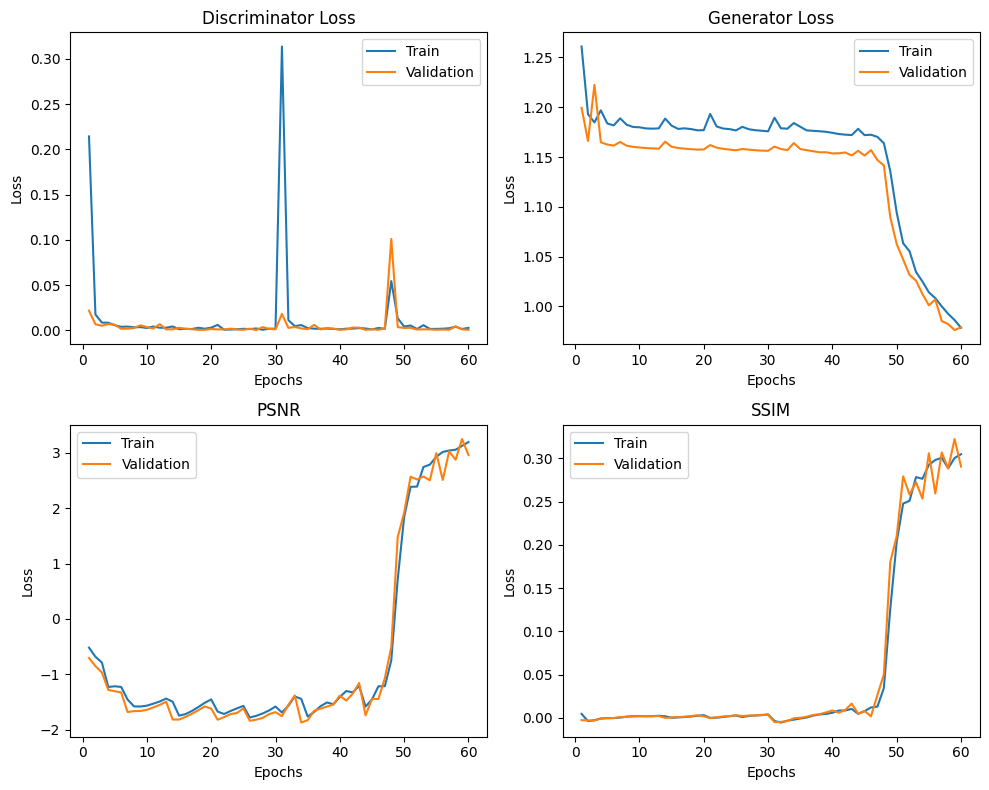

In [8]:
# Plot loss curves
plt.figure(figsize=(10, 8))

# Plot training and validation loss for Discriminator
plt.subplot(2, 2, 1)
plt.plot(range(1, len(stat_train['D_loss']) + 1), stat_train['D_loss'], label='Train')
plt.plot(range(1, len(stat_train['val_D_loss']) + 1), stat_train['val_D_loss'], label='Validation')
plt.title('Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation loss for Generator
plt.subplot(2, 2, 2)
plt.plot(range(1, len(stat_train['G_loss']) + 1), stat_train['G_loss'], label='Train')
plt.plot(range(1, len(stat_train['val_G_loss']) + 1), stat_train['val_G_loss'], label='Validation')
plt.title('Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(range(1, len(stat_train['D_loss']) + 1), stat_train['train_psnr'], label='Train')
plt.plot(range(1, len(stat_train['val_D_loss']) + 1), stat_train['val_psnr'], label='Validation')
plt.title('PSNR')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(range(1, len(stat_train['G_loss']) + 1), stat_train['train_ssim'], label='Train')
plt.plot(range(1, len(stat_train['val_G_loss']) + 1), stat_train['val_ssim'], label='Validation')
plt.title('SSIM')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [9]:
os.makedirs("test_images", exist_ok=True)
test_filenames = []
for root, dirs, files in os.walk(IMG_TEST_PATH):
    for name in files:
        test_filenames.append(os.path.join(root, name))
print(len(test_filenames))

300


In [10]:
class TestDataset(Dataset):
    def __init__(self, filename_list, hr_shape):
        hr_height, hr_width = hr_shape
        # Transforms for low resolution images and high resolution images
        self.transform = transforms.Compose([transforms.Resize((hr_height//4, hr_height//4), Image.BICUBIC),
                                             transforms.ToTensor(),
                                             transforms.Normalize(mean, std),
                                             ])
        self.files = filename_list

    def __getitem__(self, index):
        img = Image.open(self.files[index % len(self.files)])
        if img.mode != 'RGB':
            img = img.convert('RGB')
        return self.transform(img)

    def __len__(self):
        return len(self.files)
    
test_dataloader = DataLoader(TestDataset(test_filenames, hr_shape=hr_shape),
                             batch_size=1,
                             shuffle=False,  # No need to shuffle for testing
                             num_workers=opt.n_cpu)

In [11]:
# D_loss_test = 0
# G_loss_test = 0

# for i, img in enumerate(test_dataloader):
#     # Configure model input
#     imgs_lr = img.to(device)

#     optimizer_G.zero_grad()

#     # Generate a high resolution image from low resolution input
#     gen_hr = generator(imgs_lr)

#     # Save image grid with upsampled inputs and SRGAN outputs
#     imgs_lr = nn.functional.interpolate(imgs_lr, scale_factor=4)
#     gen_hr = make_grid(gen_hr, nrow=1, normalize=True)
#     imgs_lr = make_grid(imgs_lr, nrow=1, normalize=True)
#     img_grid = torch.cat((imgs_lr, gen_hr), -1)
#     save_image(img_grid, f"test_images/{i}.png", normalize=False)


# test_images_filenames = []
# for root, dirs, files in os.walk('./test_images'):
#     for name in files:
#         test_images_filenames.append(os.path.join(root, name))
        
    
# Move models and data to GPU if available
if cuda:
    generator = generator.cuda()
    generator = generator.to(device)  # Move generator parameters to CUDA device
    discriminator = discriminator.cuda()
    feature_extractor = feature_extractor.cuda()
    criterion_GAN = criterion_GAN.cuda()
    criterion_content = criterion_content.cuda()
    generator = torch.nn.DataParallel(generator)
    discriminator = torch.nn.DataParallel(discriminator)
    feature_extractor = torch.nn.DataParallel(feature_extractor)

# Define Tensor type based on GPU availability
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test loop
D_loss_test = 0
G_loss_test = 0

for i, img in enumerate(test_dataloader):
    # Configure model input
    imgs_lr = img.to(device)

    optimizer_G.zero_grad()

    # Generate a high resolution image from low resolution input
    gen_hr = generator(imgs_lr)

    # Save image grid with upsampled inputs and SRGAN outputs
    imgs_lr = nn.functional.interpolate(imgs_lr, scale_factor=4)
    gen_hr = make_grid(gen_hr, nrow=1, normalize=True)
    imgs_lr = make_grid(imgs_lr, nrow=1, normalize=True)
    img_grid = torch.cat((imgs_lr, gen_hr), -1)
    save_image(img_grid, f"test_images/{i}.png", normalize=False)

# Collect filenames of the saved test images
test_images_filenames = []
for root, dirs, files in os.walk('./test_images'):
    for name in files:
        test_images_filenames.append(os.path.join(root, name))


In [12]:
test_psnr = 0
test_ssim = 0

for i, img in enumerate(test_dataloader):
    # Configure model input
    imgs_lr = img.to(device)

    # Generate a high resolution image from low resolution input
    gen_hr = generator(imgs_lr)

    # Resize the generated HR image to match the ground truth HR image size
    gen_hr_resized = nn.functional.interpolate(gen_hr, size=(imgs_lr.size(2), imgs_lr.size(3)), mode='bicubic', align_corners=False)

    # Convert to numpy arrays
    gen_hr_np = gen_hr_resized.squeeze().detach().cpu().numpy()
    imgs_hr_np = img.squeeze().detach().cpu().numpy()

    # Calculate PSNR and SSIM    
    psnr = peak_signal_noise_ratio(imgs_hr_val, val_gen_hr, data_range=1.0)
    ssim = structural_similarity(imgs_hr_val, val_gen_hr, win_size=min(imgs_hr_val.shape[1], imgs_hr_val.shape[2], 11), data_range=1.0, multichannel=True)
            
    
    test_psnr += psnr
    test_ssim += ssim


test_psnr /= len(test_dataloader)
test_ssim /= len(test_dataloader)

print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")

Test PSNR: 3.1071602587294347
Test SSIM: 0.31503698571414895


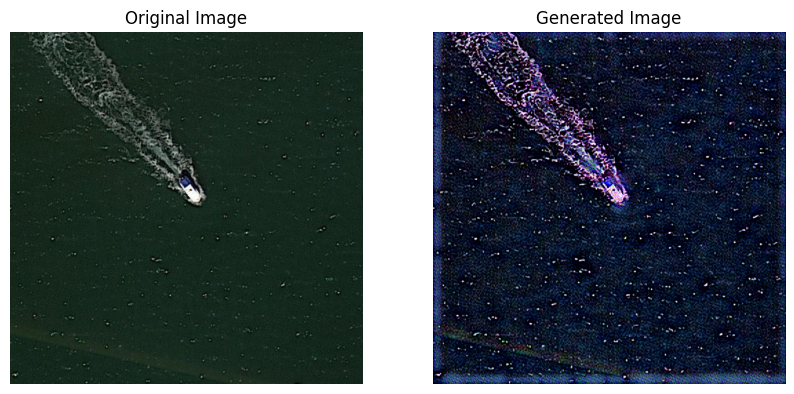

In [13]:
import matplotlib.pyplot as plt

# Choose an index of the image from the test set
index = 10  # You can change this index to visualize different images from the test set

# Load the selected image from the test set
test_image = Image.open(test_filenames[index]).convert('RGB')

# Transform the image to match the requirements of your model
transform = transforms.Compose([
    transforms.Resize((opt.hr_height, opt.hr_width), Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
input_image = transform(test_image).unsqueeze(0).to(device)

# Generate the high-resolution image from the low-resolution input using the generator
with torch.no_grad():
    generated_image = generator(input_image).cpu().squeeze(0)
    generated_image = generated_image.permute(1, 2, 0).numpy()  # Change tensor shape for plotting

# Plot the original and generated images side by side
plt.figure(figsize=(10, 5))

# Original (low-resolution) image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(test_image)
plt.axis('off')

# Generated (high-resolution) image
plt.subplot(1, 2, 2)
plt.title('Generated Image')
plt.imshow(generated_image)
plt.axis('off')

plt.show()


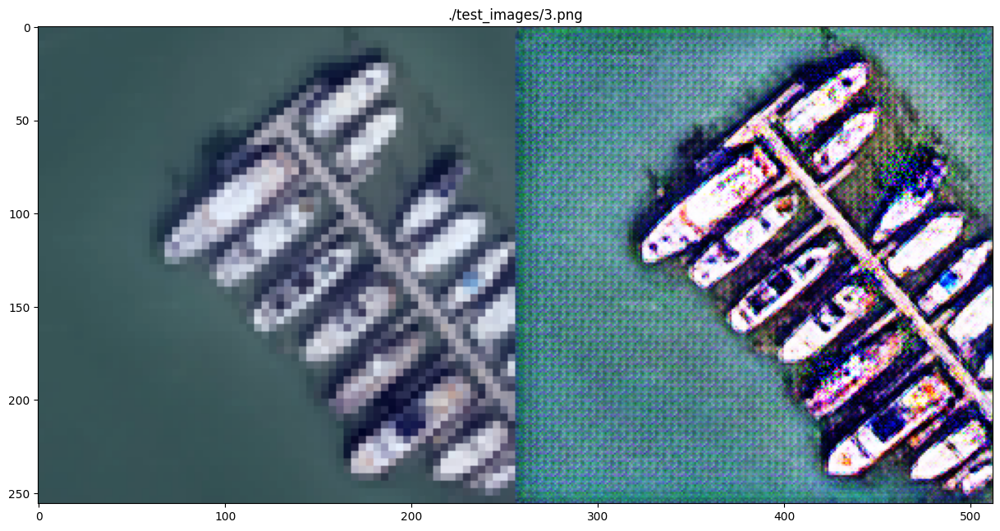

In [14]:
random_img_index = random.randint(0, len(test_images_filenames))
img_test = Image.open(test_images_filenames[random_img_index])

fig = plt.figure(figsize=(15, 15))
    
a = fig.add_subplot(1, 1, 1)
a.set_title(test_images_filenames[random_img_index])
imgplot = plt.imshow(img_test)

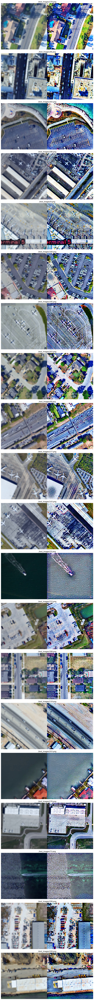

In [15]:
import random
import matplotlib.pyplot as plt

# Define the number of images to plot
num_images = 20

# Define the figure size (width, height) in inches
fig_width = 25
fig_height = 100  # Adjust the height as needed to accommodate the larger figures

# Create a figure and axis objects
fig, axes = plt.subplots(nrows=num_images, figsize=(fig_width, fig_height))

for i in range(num_images):
    # Randomly select an image index
    random_img_index = random.randint(0, len(test_images_filenames) - 1)
    
    # Open the image
    img_test = Image.open(test_images_filenames[random_img_index])
    
    # Plot the image
    axes[i].imshow(img_test)
    axes[i].set_title(test_images_filenames[random_img_index])
    axes[i].axis('off')

plt.tight_layout()
plt.show()
